In [1]:
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import xlrd
import datetime as dt
from scipy.stats import chi2_contingency
from scipy.stats import chi2
from scipy import stats
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn import metrics
import plotly.express as px

In [2]:
population = pd.read_csv('population2013-2018.csv')
raw = pd.read_csv('gunViolence.csv')
raw['year'] = pd.DatetimeIndex(raw['date']).year
df = pd.merge(raw,population,on = ['year','state'],how = 'left')

In [5]:
pd.set_option('max_columns', 100)
df.columns

Index(['incident_id', 'date', 'state', 'city_or_county', 'address', 'n_killed',
       'n_injured', 'incident_url', 'source_url',
       'incident_url_fields_missing', 'congressional_district', 'gun_stolen',
       'gun_type', 'incident_characteristics', 'latitude',
       'location_description', 'longitude', 'n_guns_involved', 'notes',
       'participant_age', 'participant_age_group', 'participant_gender',
       'participant_name', 'participant_relationship', 'participant_status',
       'participant_type', 'sources', 'state_house_district',
       'state_senate_district', 'year', 'population'],
      dtype='object')

In [14]:
pd.date_range(start='1/1/2013', periods=5, freq='B' )

DatetimeIndex(['2013-01-01', '2013-01-02', '2013-01-03', '2013-01-04',
               '2013-01-07'],
              dtype='datetime64[ns]', freq='B')

In [3]:
from datetime import datetime
df['date'] = [datetime.strptime(d, '%m/%d/%Y') for d in df['date']]
df['month'] = df['date'].dt.month
df['monthday'] = df['date'].dt.day
df['weekday'] = df['date'].dt.weekday

In [4]:
def missvalcount(df):
    count = 0
    cols = df.columns
    for col in cols:
         a = (df[col].isnull().mean()*100).round(2)
         print(col +'==> ' + str(a))
    plt.figure(figsize=(25,8))
    sns.heatmap(df.isnull(), cbar=False, cmap='viridis')

incident_id==> 0.0
date==> 0.0
state==> 0.0
city_or_county==> 0.0
address==> 6.88
n_killed==> 0.0
n_injured==> 0.0
incident_url==> 0.0
source_url==> 0.2
incident_url_fields_missing==> 0.0
congressional_district==> 4.98
gun_stolen==> 41.51
gun_type==> 41.49
incident_characteristics==> 0.14
latitude==> 3.31
location_description==> 82.44
longitude==> 3.31
n_guns_involved==> 41.49
notes==> 33.8
participant_age==> 38.51
participant_age_group==> 17.57
participant_gender==> 15.17
participant_name==> 51.01
participant_relationship==> 93.42
participant_status==> 11.53
participant_type==> 10.37
sources==> 0.25
state_house_district==> 16.18
state_senate_district==> 13.49
year==> 0.0
population==> 0.0
month==> 0.0
monthday==> 0.0
weekday==> 0.0


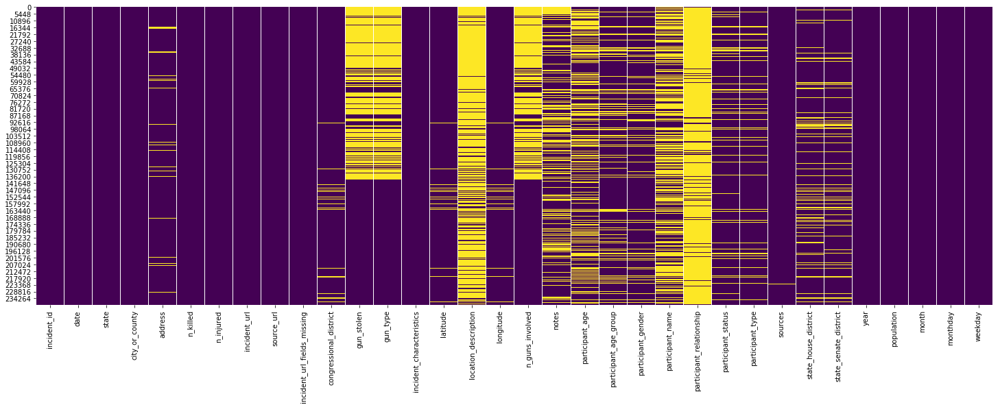

In [5]:
missvalcount(df)

In [15]:
# drop the participant_name and participant relationship casuse it has meaning less infomormation as well as high number of missing vals.
df.drop(['participant_name','participant_relationship'
    ], axis = 1, inplace = True)

In [18]:
len(df)

239678

In [17]:
df.head(2)

,incident_id,date,state,city_or_county,address,n_killed,n_injured,incident_url,source_url,incident_url_fields_missing,congressional_district,gun_stolen,gun_type,incident_characteristics,latitude,location_description,longitude,n_guns_involved,notes,participant_age,participant_age_group,participant_gender,participant_status,participant_type,sources,state_house_district,state_senate_district,year,population
0,461105,1/1/2013,Pennsylvania,Mckeesport,1506 Versailles Avenue and Coursin Street,0,4,http://www.gunviolencearchive.org/incident/461105,http://www.post-gazette.com/local/south/2013/0...,False,14.0,NaN,NaN,Shot - Wounded/Injured||Mass Shooting (4+ vict...,40.3467,NaN,-79.8559,NaN,Julian Sims under investigation: Four Shot and...,0::20,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||3::Male||4::Female,0::Arrested||1::Injured||2::Injured||3::Injure...,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://pittsburgh.cbslocal.com/2013/01/01/4-pe...,NaN,NaN,2013,12776621
1,460726,1/1/2013,California,Hawthorne,13500 block of Cerise Avenue,1,3,http://www.gunviolencearchive.org/incident/460726,http://www.dailybulletin.com/article/zz/201301...,False,43.0,NaN,NaN,"Shot - Wounded/Injured||Shot - Dead (murder, a...",33.9090,NaN,-118.3330,NaN,Four Shot; One Killed; Unidentified shooter in...,0::20,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male,0::Killed||1::Injured||2::Injured||3::Injured,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://losangeles.cbslocal.com/2013/01/01/man-...,62.0,35.0,2013,38280824


In [24]:
def separate(df):
    df = df.replace("||", "|")
    df = df.replace("::", ":")
    df=df.split("|")
    df=[(x.split(":")) for x in df]
    y = []
    for  i in range (0, len(df)):
        y.append(df[i][-1])
    return(y)

In [25]:
# participant_gender
df['participant_gender'] = df['participant_gender'].fillna("0::Zero")
df['participant_gender'] = df['participant_gender'].apply(lambda x: separate(x))
df['Males'] = df['participant_gender'].apply(lambda x: x.count('Male'))
df['Females'] = df['participant_gender'].apply(lambda x: x.count('Female'))
df['Gender_Unknown'] = df['participant_gender'].apply(lambda x: x.count('Zero'))

In [26]:
# participant_status---this is similar to then injured and killed column---maybe we don't need it 
df['participant_status'] = df['participant_status'].fillna("0::Unknow")
df['participant_status'] = df['participant_status'].apply(lambda x: separate(x))
df['status_Unharmed'] = df['participant_status'].apply(lambda x: x.count('Unharmed'))
df['status_Arrested'] = df['participant_status'].apply(lambda x: x.count('Arrested'))
df['status_Injured'] = df['participant_status'].apply(lambda x: x.count('Injured'))
df['status_Killed'] = df['participant_status'].apply(lambda x: x.count('Killed'))
df['status_Unknown'] = df['participant_status'].apply(lambda x: x.count('Unknow'))

In [27]:
# seperate the participant_type
df['participant_type'] = df['participant_type'].fillna("0::Zero")
df['Type'] = df['participant_type'].apply(lambda x: separate(x))

df['Type_Suspect'] = df['Type'].apply(lambda x: x.count('Subject-Suspect'))
df['Type_Victim'] = df['Type'].apply(lambda x: x.count('Victim'))
df['Type_Unknown'] = df['Type'].apply(lambda x: x.count('Unknow'))

In [28]:
# seperate the age_group
df['participant_age_group'] = df['participant_age_group'].fillna("0::Unknown")
df['age_group'] = df['participant_age_group'].apply(lambda x: separate(x))

df['age_adult 18+'] = df['age_group'].apply(lambda x: x.count('Adult 18+'))
df['age_Child 0-11'] = df['age_group'].apply(lambda x: x.count('Child 0-11')) # three columns
df['age_Teen 12-17'] = df['age_group'].apply(lambda x: x.count('Teen 12-17'))
df['age_unknown'] = df['age_group'].apply(lambda x: x.count('Unknow'))

In [29]:
# Participant_age Columns
df['participant_age'] = df['participant_age'].fillna('0:18')
df['age'] = df['participant_age'].apply(lambda x: separate(x))
df['avg_age']=[np.mean(np.array(df['age'][i],dtype=np.float32)) for i in range(0,len(df['age']))]

In [30]:
df.drop(['incident_url','source_url', 'incident_url_fields_missing',
              'participant_age','participant_gender','participant_status','participant_type','sources',
              'Type','age_group','age'], axis=1, inplace=True)

incident_id==> 0.0
date==> 0.0
state==> 0.0
city_or_county==> 0.0
address==> 6.88
n_killed==> 0.0
n_injured==> 0.0
congressional_district==> 4.98
gun_stolen==> 41.51
gun_type==> 41.49
incident_characteristics==> 0.14
latitude==> 3.31
location_description==> 82.44
longitude==> 3.31
n_guns_involved==> 41.49
notes==> 33.8
participant_age_group==> 0.0
state_house_district==> 16.18
state_senate_district==> 13.49
year==> 0.0
population==> 0.0
month==> 0.0
monthday==> 0.0
weekday==> 0.0
Males==> 0.0
Females==> 0.0
Gender_Unknown==> 0.0
status_Unharmed==> 0.0
status_Arrested==> 0.0
status_Injured==> 0.0
status_Killed==> 0.0
status_Unknown==> 0.0
Type_Suspect==> 0.0
Type_Victim==> 0.0
Type_Unknown==> 0.0
age_adult 18+==> 0.0
age_Child 0-11==> 0.0
age_Teen 12-17==> 0.0
age_unknown==> 0.0
avg_age==> 0.0


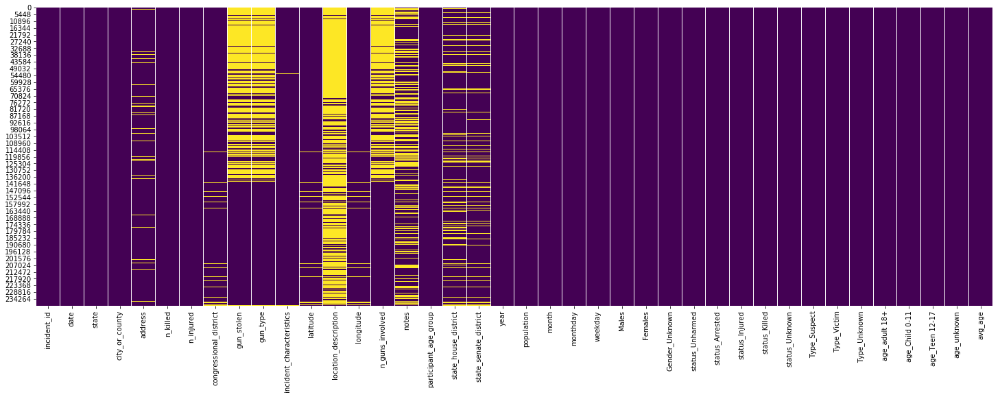

In [14]:
missvalcount(df)

# Number of People Killed By Year

Text(0.5, 1.0, 'Number of People Killed with respect to year')

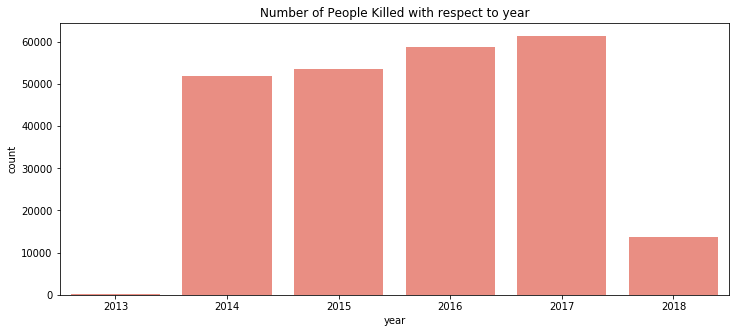

In [15]:
plt.figure(figsize=(12,5))
ax = sns.countplot(df['year'],color='salmon')
ax.set_title('Number of People Killed with respect to year')


# Number of incident By City

In [19]:
groupby_city_count = df[['city_or_county','incident_id']].groupby('city_or_county').count().reset_index()
groupby_city_count = groupby_city_count.sort_values(by='incident_id', ascending=False).head(30)
groupby_city_count = groupby_city_count.sort_values('incident_id', ascending=False)
fig = px.bar(groupby_city_count, x='city_or_county', y='incident_id',
             labels={'Count of Gun Voilence by State'}
             )
fig.update_traces(marker_color='rgb(240,128,128)')
fig.show()

# Number of People Killed By City

In [20]:
groupby_city_countk = df[['city_or_county','n_killed']].groupby('city_or_county').agg({'n_killed':'sum'}).reset_index()
groupby_city_countk = groupby_city_countk.sort_values(by='n_killed', ascending=False).head(30)
groupby_city_countk = groupby_city_countk.sort_values('n_killed', ascending=False)
fig = px.bar(groupby_city_countk, x='city_or_county', y='n_killed',
             labels={'Count of Gun Voilence by State'} 
             )
fig.update_traces(marker_color='rgb(255,64,64)')
fig.show()

In [31]:
df.columns

Index(['incident_id', 'date', 'state', 'city_or_county', 'address', 'n_killed',
       'n_injured', 'congressional_district', 'gun_stolen', 'gun_type',
       'incident_characteristics', 'latitude', 'location_description',
       'longitude', 'n_guns_involved', 'notes', 'participant_age_group',
       'state_house_district', 'state_senate_district', 'year', 'population',
       'Males', 'Females', 'Gender_Unknown', 'status_Unharmed',
       'status_Arrested', 'status_Injured', 'status_Killed', 'status_Unknown',
       'Type_Suspect', 'Type_Victim', 'Type_Unknown', 'age_adult 18+',
       'age_Child 0-11', 'age_Teen 12-17', 'age_unknown', 'avg_age'],
      dtype='object')

# Number of Male and Female killed by Year

In [21]:
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
fig = go.Figure()
male = df[['year','Males']].groupby('year').sum().reset_index()
female = df[['year','Females']].groupby('year').sum().reset_index()
fig.add_trace(go.Bar(
    x=male['year'],
    y=male['Males'],
    name='Males Involved',
    marker_color='indianred'
))

fig.add_trace(go.Bar(
    x=female['year'],
    y=female['Females'],
    name='Females Involved',
    marker_color='lightsalmon'
))
# # Here we modify the tickangle of the xaxis, resulting in rotated labels.
fig.update_layout(barmode='group', xaxis_tickangle=-45)
fig.update_layout(title_text='Number of People Involved by Gender')
fig.show()

KeyError: "['Males'] not in index"

# Average Number of Incidents By Month

In [22]:
import calendar
tempdf = df[df['year'].isin(['2014','2015','2016','2017'])]
tempdf1 = tempdf.groupby(['year','month']).agg({'month' : 'count'}).rename(columns={'month': 'month_count'}).reset_index()
aggregated = tempdf1.groupby(['month']).agg({'month_count' : 'mean'})
x2 = aggregated.index.tolist()
y2 = aggregated.month_count.tolist()
mapp = {}
for m,v in zip(x2, y2):
    mapp[m] = v
xn = [calendar.month_abbr[int(x)] for x in sorted(x2)]
vn = [mapp[x] for x in sorted(x2)]

trace1 = go.Bar(x=xn, y=vn, opacity=0.75, name="month", marker=dict(color='rgba(100, 20, 10, 0.6)'))
layout = dict(height=400, title='Average number of Incidents by Months', legend=dict(orientation="h"));
fig = go.Figure(data=[trace1], layout=layout)
iplot(fig, filename='stacked-bar')

KeyError: 'month'

# Number of People Killed and Injured by Month (Total)

In [32]:
df.groupby('month').sum()[['n_killed', 'n_injured']].plot(ax=plt.subplots(figsize=(15,5))[1])
plt.title('Injuries and deaths per month (1=january, ..., 12=December)')

KeyError: 'month'

# Average Number of Incidents happen in weekday

In [33]:
tempdf1 = df.groupby(['year', 'weekday']).agg({'weekday' : 'count'}).rename(columns={'weekday' : 'weekday_count'}).reset_index()
aggregated = tempdf1.groupby(['weekday']).agg({'weekday_count' : 'mean'})

x2 = aggregated.index.tolist()
y2 = aggregated.weekday_count.tolist()

weekmap = {0:'Mon', 1:'Tue', 2:'Wed', 3:'Thu', 4:'Fri', 5:'Sat', 6:'Sun'}
x2 = [weekmap[x] for x in x2]
wkmp = {}
for j,x in enumerate(x2):
    wkmp[x] = y2[j]
order = list(weekmap.values())
ordervals = [wkmp[val] for val in order]

trace1 = go.Bar(x=order, y=ordervals, opacity=0.75, name="weekday", marker=dict(color='rgba(61, 60, 250, 0.6)'))
layout = dict(height=400, title='Average number of incidents by Day of the Week', legend=dict(orientation="h"));

fig = go.Figure(data=[trace1], layout=layout)
iplot(fig, filename='stacked-bar')

KeyError: 'weekday'

# Number of People Killed and Injured in weekdays (Total)

Text(0.5, 1.0, 'Injuries and deaths per weekday (0=monday, ..., 6=sunday)')

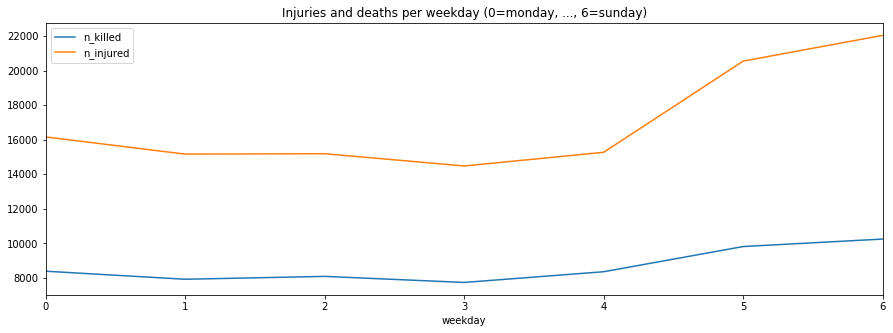

In [22]:
df.groupby('weekday').sum()[['n_killed', 'n_injured']].plot(ax=plt.subplots(figsize=(15,5))[1])
plt.title('Injuries and deaths per weekday (0=monday, ..., 6=sunday)')

# Crime Index

In [23]:
df['Crime_index'] = ((df['n_killed']+ df['n_injured'])/df['population'])*100000

import plotly.express as px
index = df[['state','population','Crime_index']].groupby(['state']).mean().reset_index()
index = index.sort_values(by='Crime_index', ascending=False).head(20)
fig = px.scatter(index, x="population", y='Crime_index',
	         size="Crime_index", color="state",
                 hover_name="state", log_x=False, size_max=65)
fig.show()

# Number of guns involved

In [24]:
# Generate  
n_gun = [] 
for value in df["n_guns_involved"]: 
    if value ==1: 
        n_gun.append("1") 
    elif value ==2: 
        n_gun.append("2") 
    elif value ==3: 
        n_gun.append("3")
    elif value ==4: 
        n_gun.append("4") 
    else: 
        n_gun.append("+4") 
df["n_gun"] = n_gun

In [25]:
night_colors = ['rgb(56, 75, 126)', 'rgb(18, 36, 37)', 'rgb(34, 53, 101)',
                'rgb(36, 55, 57)', 'rgb(6, 4, 4)']

In [26]:
fig = go.Figure(data=[go.Pie(labels=df['n_gun'], values=df['n_guns_involved'], marker_colors=night_colors)])
#fig.update_traces(hoverinfo='label+percent', textinfo='value', textfont_size=20,
#               marker=dict(color=night_colors, line=dict(color='#000000', width=2)))
# fig.update_traces(hoverinfo='label+percent+name', textinfo='none')
fig.update(layout_title_text='Number of Guns Involved')
#            
fig.show()

# Number of Incidents happen statewise Top 30

In [35]:
groupby_state_count = df[['state','incident_id']].groupby('state').count().reset_index()
groupby_state_count = groupby_state_count.sort_values(by='incident_id', ascending=False).head(10)
groupby_state_count = groupby_state_count.sort_values('incident_id', ascending=False)
fig = px.bar(groupby_state_count, x='state', y='incident_id',
             labels={'Count of Gun Voilence by State'} 
             )
fig.show()

# Number of Killed State wise (Total) top 30

In [36]:
groupby_state_countk = df[['state','n_killed']].groupby('state').agg({'n_killed':'sum'}).reset_index()
groupby_state_countk = groupby_state_countk.sort_values(by='n_killed', ascending=False).head(10)
groupby_state_countk = groupby_state_countk.sort_values('n_killed', ascending=False)
fig = px.bar(groupby_state_countk, x='state', y='n_killed',
             labels={'Count of Gun Voilence by State'} 
             )
fig.update_traces(marker_color='rgb(238,99,99)')
fig.show()

# Donut Chart Age Group

In [29]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
fig = make_subplots(rows=2, cols=3, specs=[[{'type':'domain'}, {'type':'domain'},{'type':'domain'}],
                                          [{'type':'domain'}, {'type':'domain'},{'type':'domain'}]])

df2013 = df[df['year']==2013]
df2014 = df[df['year']==2014]
df2015 = df[df['year']==2015]
df2016 = df[df['year']==2016]
df2017 = df[df['year']==2017]
df2018 = df[df['year']==2018]

labels = ['age_adult 18+','age_Child 0-11','age_Teen 12-17','age_unknown']
values1 = [df2013['age_adult 18+'].sum(), df2013['age_Child 0-11'].sum(), df2013['age_Teen 12-17'].sum(),df2013['age_unknown'].sum()]
values2 = [df2014['age_adult 18+'].sum(), df2014['age_Child 0-11'].sum(), df2014['age_Teen 12-17'].sum(),df2014['age_unknown'].sum()]
values3 = [df2015['age_adult 18+'].sum(), df2015['age_Child 0-11'].sum(), df2015['age_Teen 12-17'].sum(),df2015['age_unknown'].sum()]
values4 = [df2016['age_adult 18+'].sum(), df2016['age_Child 0-11'].sum(), df2016['age_Teen 12-17'].sum(),df2016['age_unknown'].sum()]
values5 = [df2017['age_adult 18+'].sum(), df2017['age_Child 0-11'].sum(), df2017['age_Teen 12-17'].sum(),df2017['age_unknown'].sum()]
values6 = [df2018['age_adult 18+'].sum(), df2018['age_Child 0-11'].sum(), df2018['age_Teen 12-17'].sum(),df2018['age_unknown'].sum()]

fig.add_trace(go.Pie(labels=labels, values=values1, hole=.5),
              1, 1)
fig.add_trace(go.Pie(labels=labels, values=values2, hole=.5),
              1, 2)
fig.add_trace(go.Pie(labels=labels, values=values3, hole=.5),
              1, 3)
fig.add_trace(go.Pie(labels=labels, values=values4, hole=.5),
              2, 1)
fig.add_trace(go.Pie(labels=labels, values=values5, hole=.5),
              2, 2)
fig.add_trace(go.Pie(labels=labels, values=values6, hole=.5),
              2, 3)
# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.5, hoverinfo="label+percent+name")

fig.update_layout(
    title_text="People involved by Age",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='2013', x=0.105, y=0.83, font_size=20, showarrow=False),
                 dict(text='2014', x=0.5, y=0.83, font_size=20, showarrow=False),
                 dict(text='2015', x=0.895, y=0.83, font_size=20, showarrow=False),
                 dict(text='2016', x=0.105, y=0.17, font_size=20, showarrow=False),
                 dict(text='2017', x=0.5, y=0.17, font_size=20, showarrow=False),
                 dict(text='2018', x=0.895, y=0.17, font_size=20, showarrow=False)])


fig.show()

# Age Distribution involved

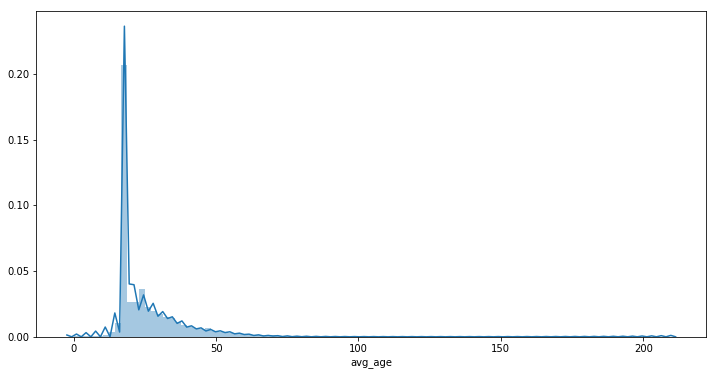

In [30]:
plt.figure(figsize=(12,6))
ax = sns.distplot(a= df['avg_age'], bins=100)

# Text Mining

In [31]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


In [32]:
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

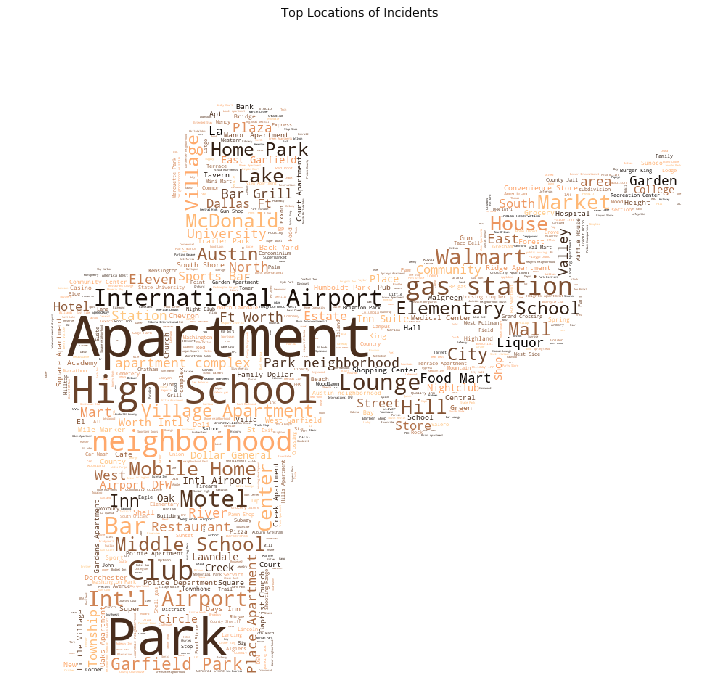

In [33]:
mask = np.array(Image.open('gun.jpg'))
txt = " ".join(df['location_description'].dropna())
wc = WordCloud(mask=mask, max_words=1200, stopwords=STOPWORDS, colormap='copper', background_color='White').generate(txt)
plt.figure(figsize=(15,12))
plt.imshow(wc)
plt.axis('off')
plt.title('Top Locations of Incidents');

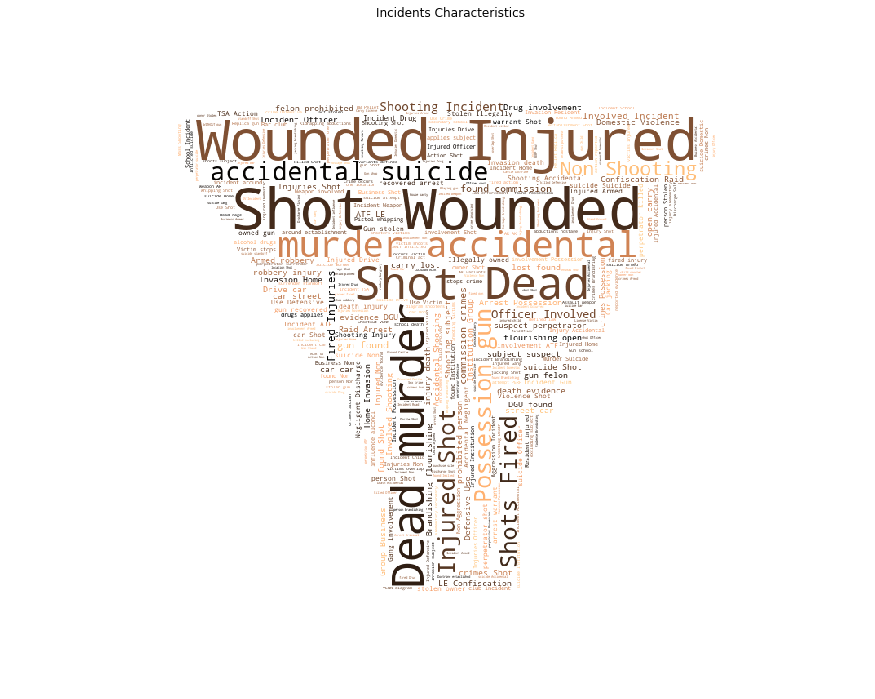

In [34]:
mask = np.array(Image.open('funnel.jpg'))
txt = " ".join(df['incident_characteristics'].dropna())
wc = WordCloud(mask=mask, max_words=1200, stopwords=STOPWORDS, colormap='copper', background_color='White').generate(txt)
plt.figure(figsize=(15,12))
plt.imshow(wc)
plt.axis('off')
plt.title('Incidents Characteristics');